In [ ]:
%pip install kagglehub

import kagglehub

path = kagglehub.dataset_download("awsaf49/coco-2017-dataset")

print("Path to dataset files:", path)

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Resuming download from 7210008576 bytes (19674353589 bytes left)...
Resuming download from https://www.kaggle.com/api/v1/datasets/download/awsaf49/coco-2017-dataset?dataset_version_number=2 (7210008576/26884362165) bytes left.


100%|██████████| 25.0G/25.0G [1:01:00<00:00, 5.37MB/s]

Extracting files...


Path to dataset files: C:\Users\dilaw\.cache\kagglehub\datasets\awsaf49\coco-2017-dataset\versions\2


In [2]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

In [3]:
train_dir = 'C:/Users/dilaw/.cache/kagglehub/datasets/awsaf49/coco-2017-dataset/versions/2/coco2017/train2017'


if not os.path.exists(train_dir):
    print("Path does not exist!")
else:
    print("Path found.")


Path found.


5 Steps of canny edge detection:
1. Smoothing (Noise Reduction: using Gaussian Blur to smooth the image)
2. Finding Gradients (Using Sobel filters to calculate intensity changes)
3. Non-Maximum Suppression (Thin out the edges while keeping only the local maxima along the gradient direction)
4. Double Thresholding (Apply low and high thresholding to classify the pixels: strong edges, weak edges, and non-edges)
5. Edge Tracking by Hysteresis (connect weak edges)

In [ ]:
def canny_edge_detection(img, low_threshold=30, high_threshold=100):
    
    # 1. Convert to grayscale and apply adaptive Gaussian blur -- to remove noise while preserving edges
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (3, 3), sigmaX=1.2, sigmaY=1.2) # kernel size and sigma values control the blur amount
    
    # 2. Optimized gradient calculation using Scharr operator (more accurate than Sobel) -- to identify edge strength and direction
    grad_x = cv2.Scharr(blurred, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(blurred, cv2.CV_64F, 0, 1)
    
    # Fast magnitude and angle calculation using vectorized operations
    grad_mag = np.hypot(grad_x, grad_y)
    grad_dir = np.arctan2(grad_y, grad_x) * (180 / np.pi) % 180
    
    # Normalize magnitude to 0-255
    grad_mag = cv2.normalize(grad_mag, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    
    # 3. Vectorized non-maximum suppression -- to thin wide edges to single-pixel width
    height, width = grad_mag.shape
    suppressed = np.zeros_like(grad_mag, dtype=np.uint8)
    
    # Pre-calculate shifted arrays for vectorized comparison
    mag_pad = np.pad(grad_mag, ((1,1),(1,1)), mode='constant')
    
    # Create masks for each angle category
    mask_0   = ((0 <= grad_dir) & (grad_dir < 22.5)) | ((157.5 <= grad_dir) & (grad_dir <= 180))
    mask_45  = ((22.5 <= grad_dir) & (grad_dir < 67.5))
    mask_90  = ((67.5 <= grad_dir) & (grad_dir < 112.5))
    mask_135 = ((112.5 <= grad_dir) & (grad_dir < 157.5))
    
    # Vectorized comparisons using pre-shifted arrays
    suppressed[mask_0] = np.where(
        (grad_mag[mask_0] >= mag_pad[1:-1, :-2][mask_0]) & 
        (grad_mag[mask_0] >= mag_pad[1:-1, 2:][mask_0]),
        grad_mag[mask_0], 0
    )
    
    suppressed[mask_45] = np.where(
        (grad_mag[mask_45] >= mag_pad[:-2, 2:][mask_45]) & 
        (grad_mag[mask_45] >= mag_pad[2:, :-2][mask_45]),
        grad_mag[mask_45], 0
    )
    
    suppressed[mask_90] = np.where(
        (grad_mag[mask_90] >= mag_pad[:-2, 1:-1][mask_90]) & 
        (grad_mag[mask_90] >= mag_pad[2:, 1:-1][mask_90]),
        grad_mag[mask_90], 0
    )
    
    suppressed[mask_135] = np.where(
        (grad_mag[mask_135] >= mag_pad[:-2, :-2][mask_135]) & 
        (grad_mag[mask_135] >= mag_pad[2:, 2:][mask_135]),
        grad_mag[mask_135], 0
    )
    
    # 4. Optimized double thresholding -- to classify edges as strong, weak, or non-edges
    strong_edges = (suppressed >= high_threshold)
    weak_edges = ((suppressed >= low_threshold) & (suppressed < high_threshold))
    
    # 5. Ultra-fast hysteresis using connected components
    edges = np.uint8(strong_edges * 255)
    
    # Find connected weak edges using morphology
    kernel = np.ones((3, 3), np.uint8)
    strong_dilated = cv2.dilate(edges, kernel, iterations=2)
    edges = np.uint8(np.clip(edges + (weak_edges & (strong_dilated > 0)) * 255, 0, 255))
    
    # Final edge refinement
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
    
    return edges

Processing 000000000009.jpg...


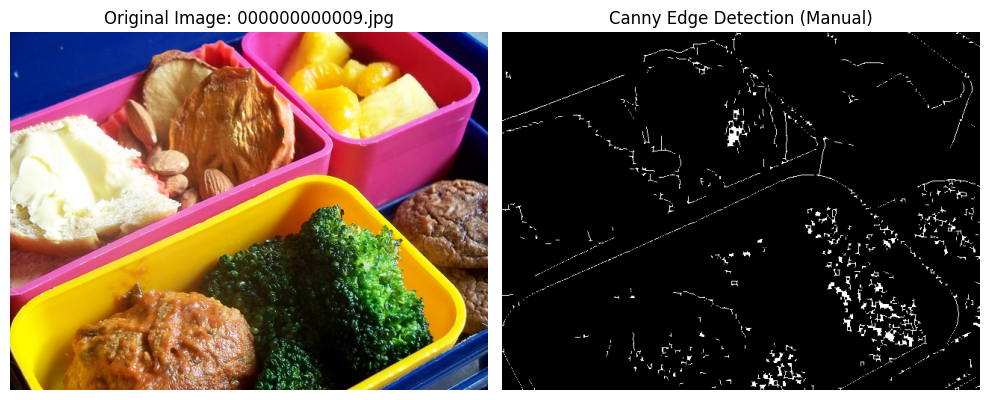

Processing 000000000025.jpg...


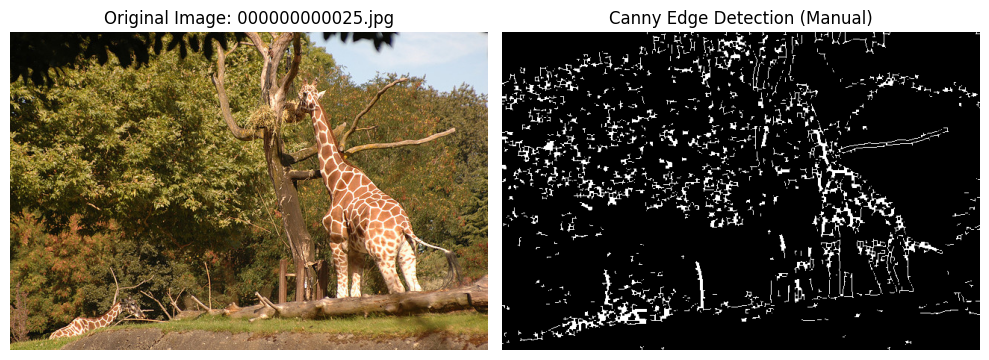

Processing 000000000030.jpg...


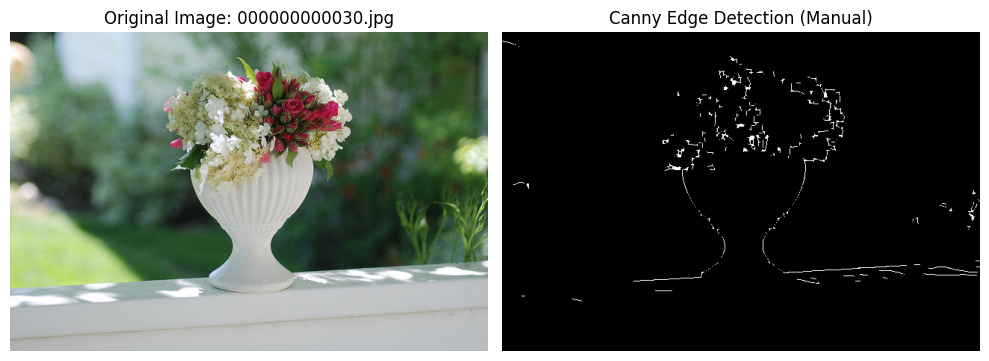

Processing 000000000034.jpg...


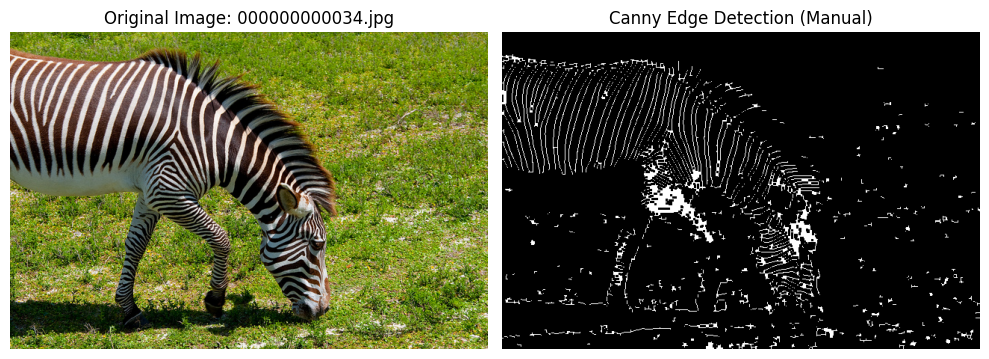

Processing 000000000036.jpg...


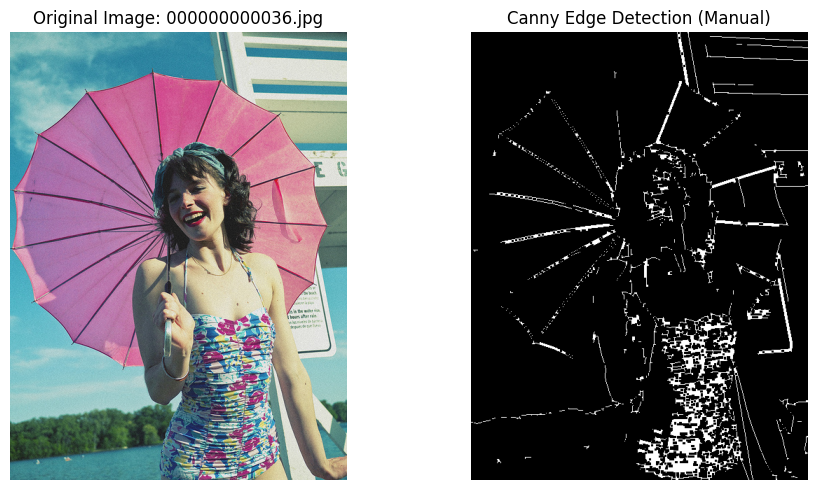

Processing 000000000042.jpg...


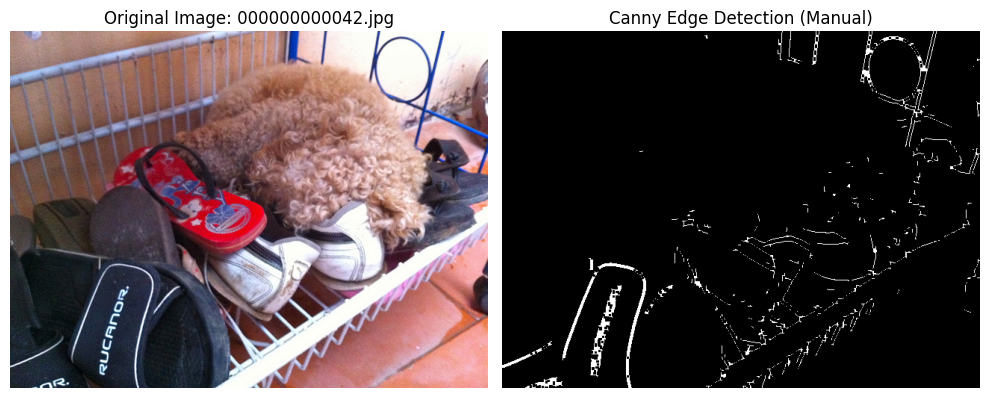

Processing 000000000049.jpg...


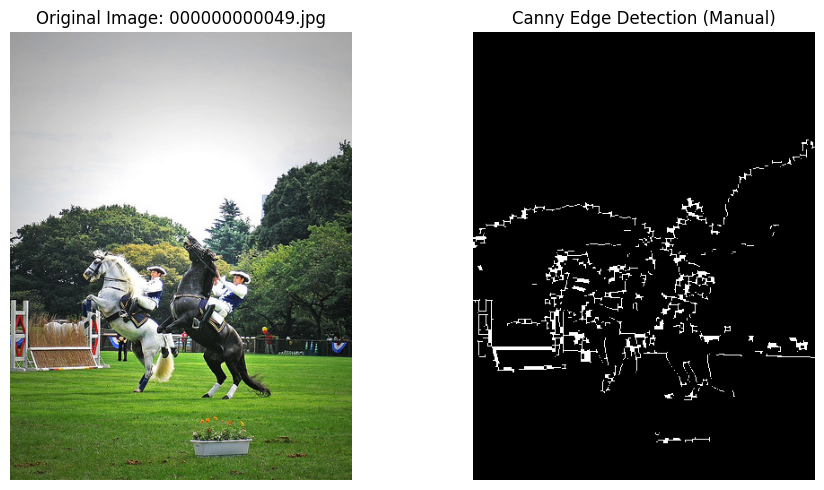

Processing 000000000061.jpg...


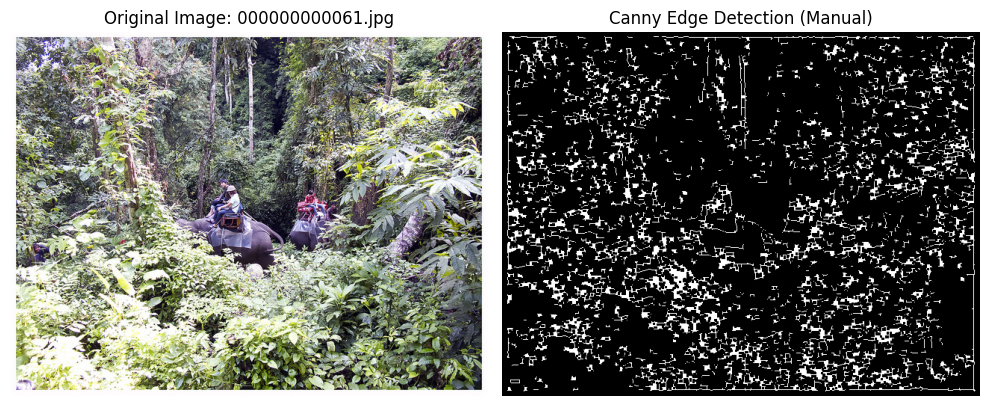

Processing 000000000064.jpg...


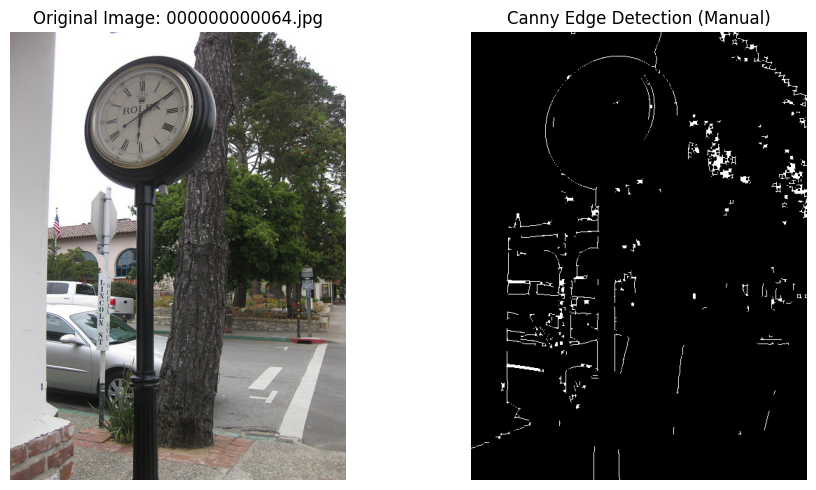

Processing 000000000071.jpg...


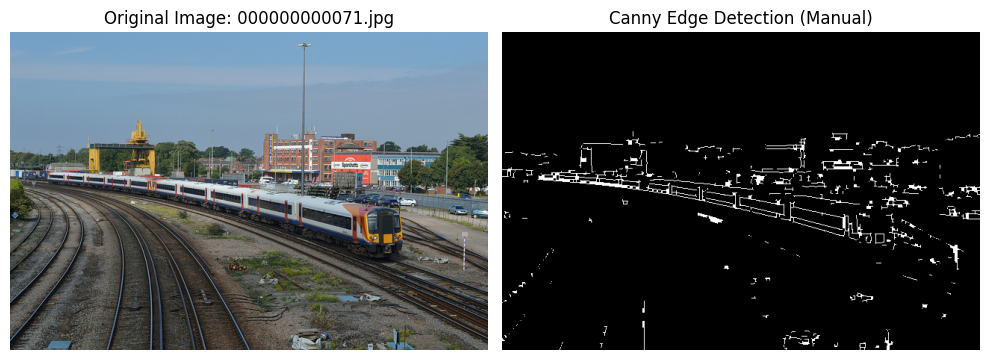

Processing 000000000072.jpg...


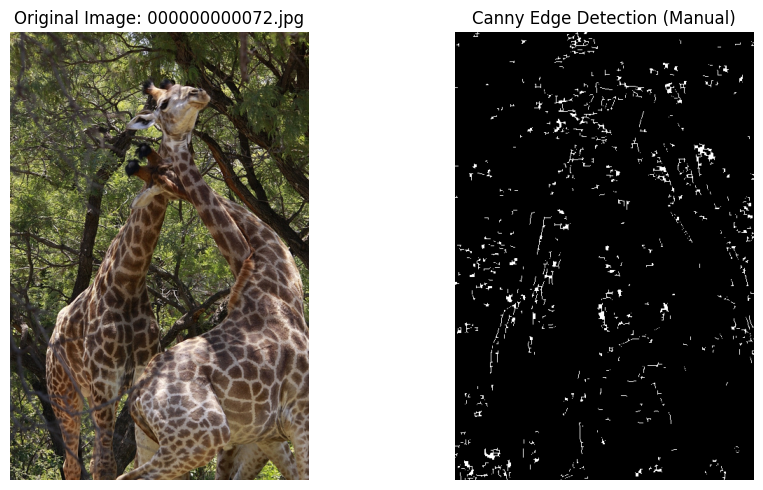

Processing 000000000073.jpg...


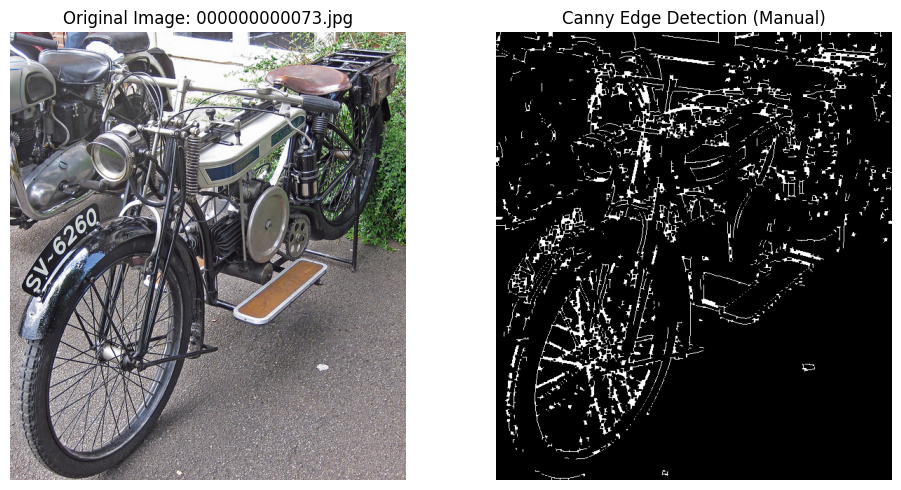

Processing 000000000074.jpg...


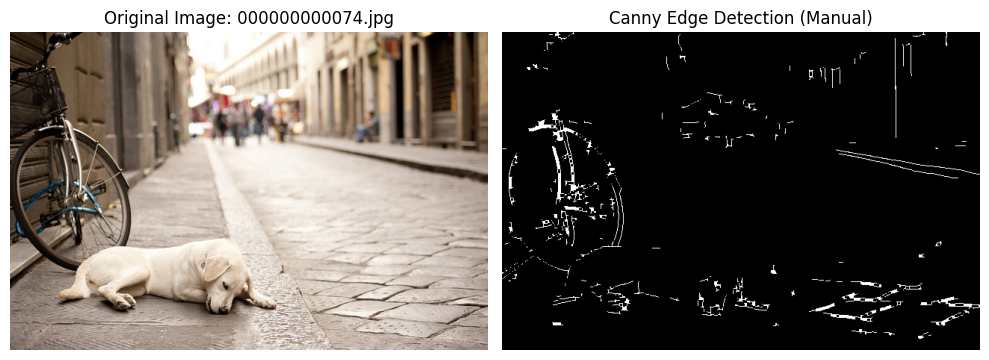

Processing 000000000077.jpg...


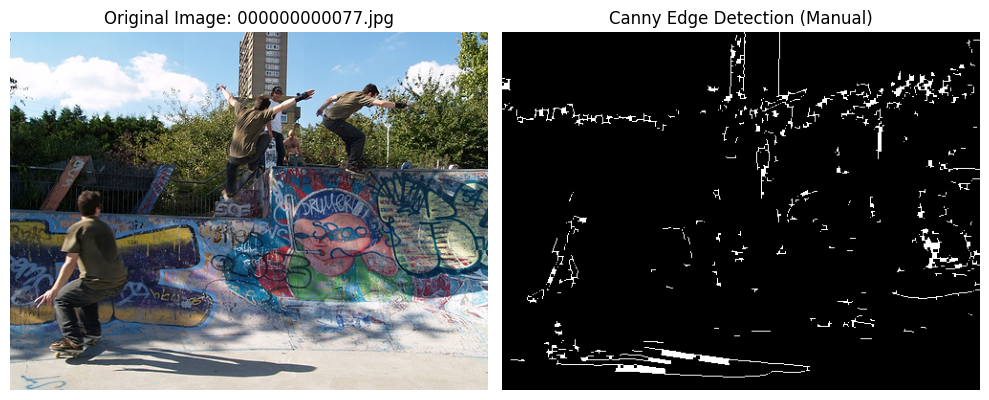

Processing 000000000078.jpg...


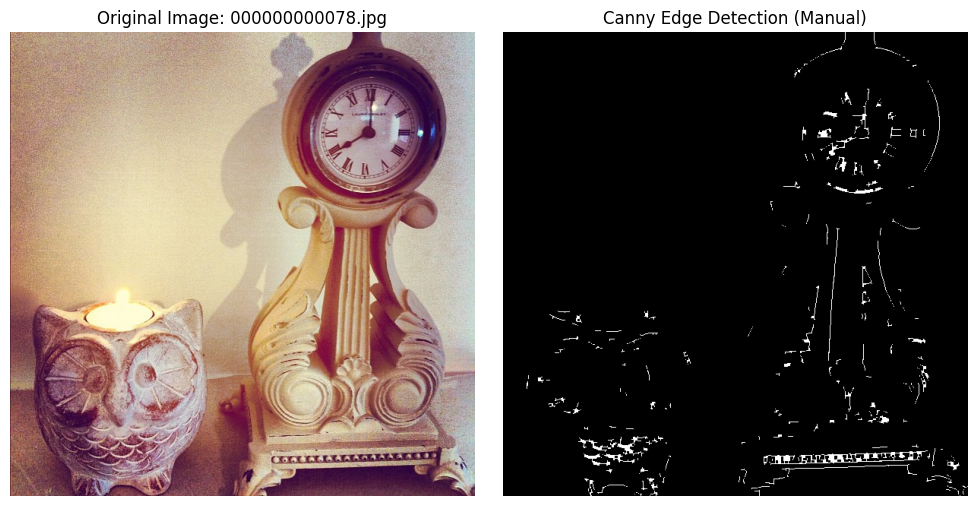

Processing 000000000081.jpg...


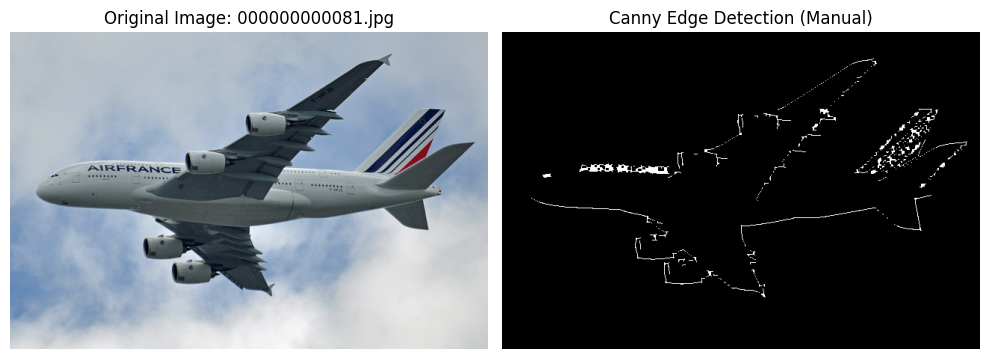

Processing 000000000086.jpg...


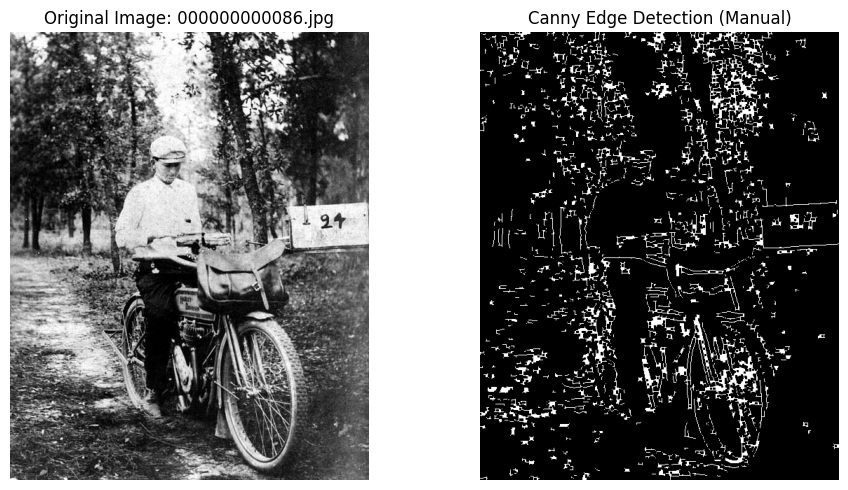

Processing 000000000089.jpg...


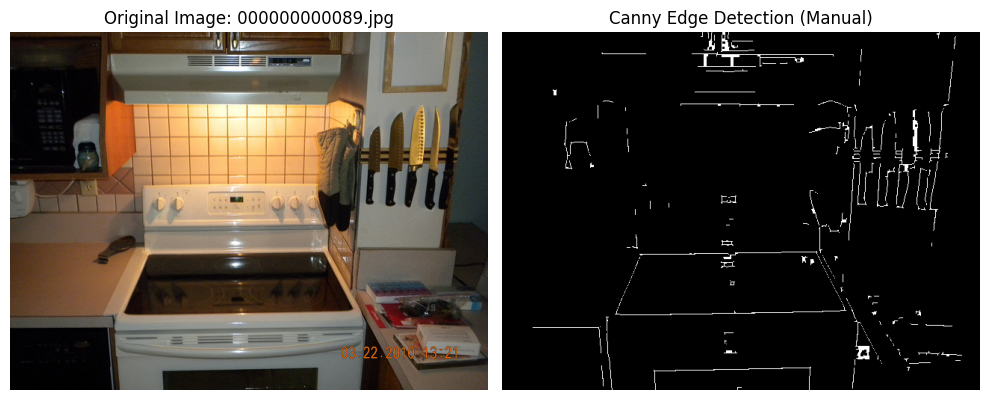

Processing 000000000092.jpg...


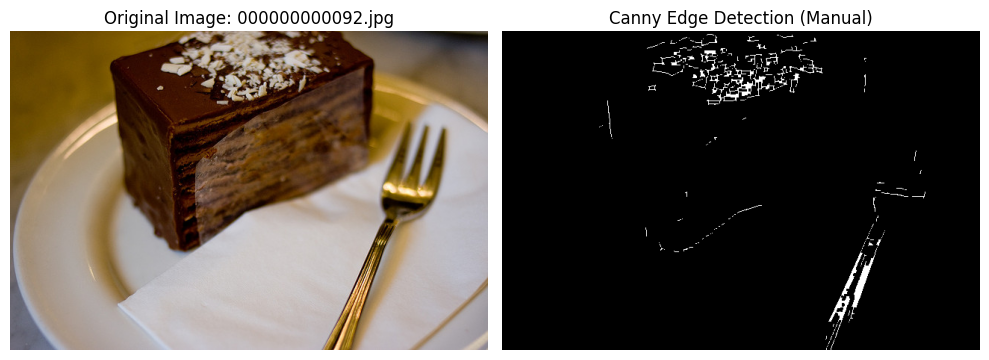

Processing 000000000094.jpg...


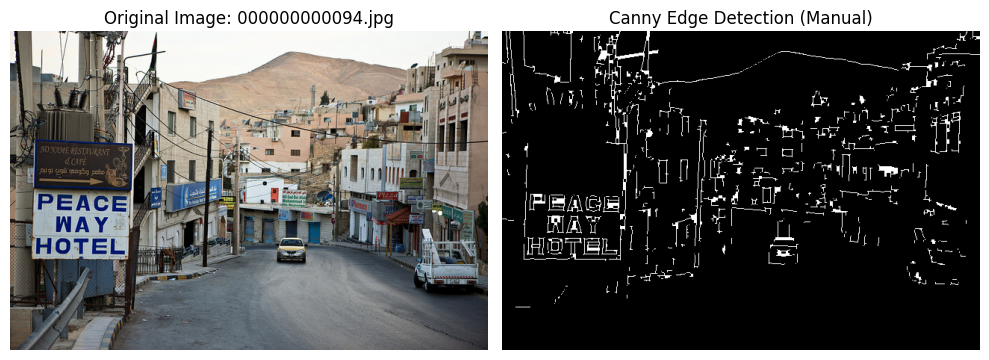

Processing 000000000109.jpg...


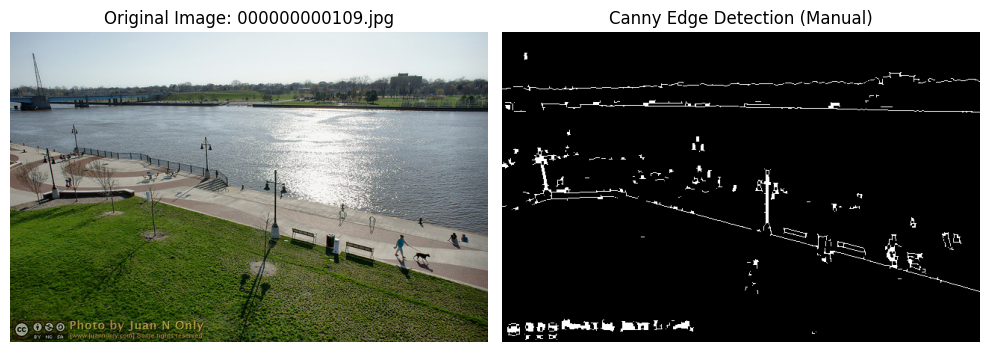

Processing 000000000110.jpg...


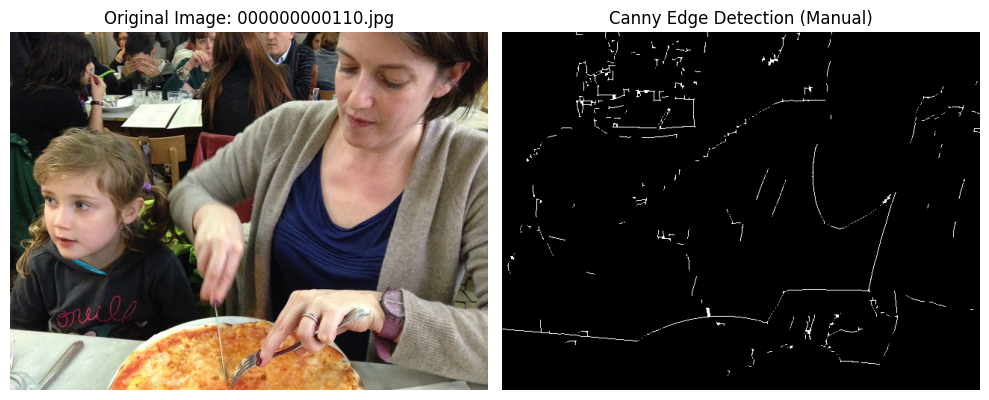

Processing 000000000113.jpg...


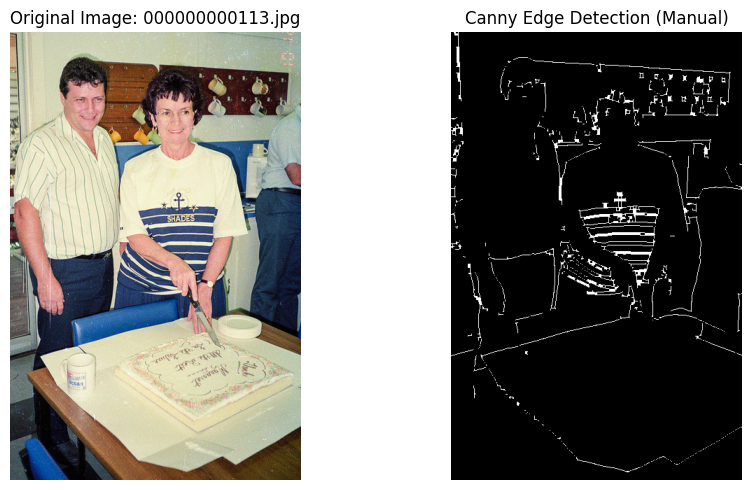

Processing 000000000127.jpg...


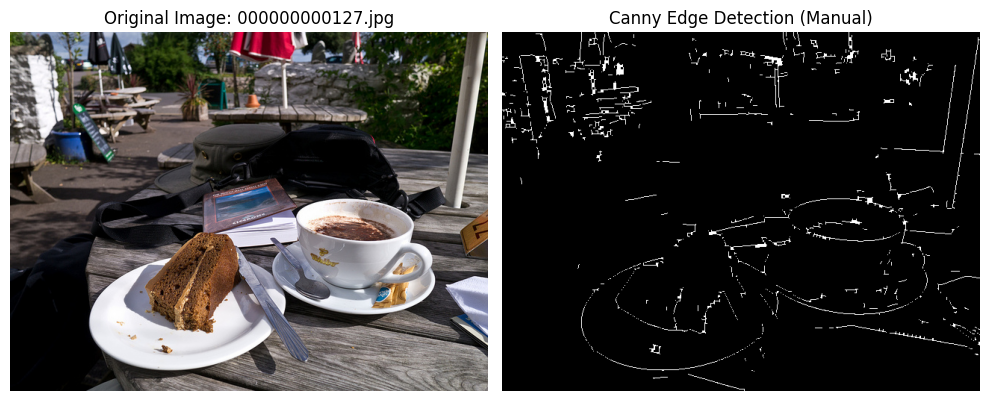

Processing 000000000133.jpg...


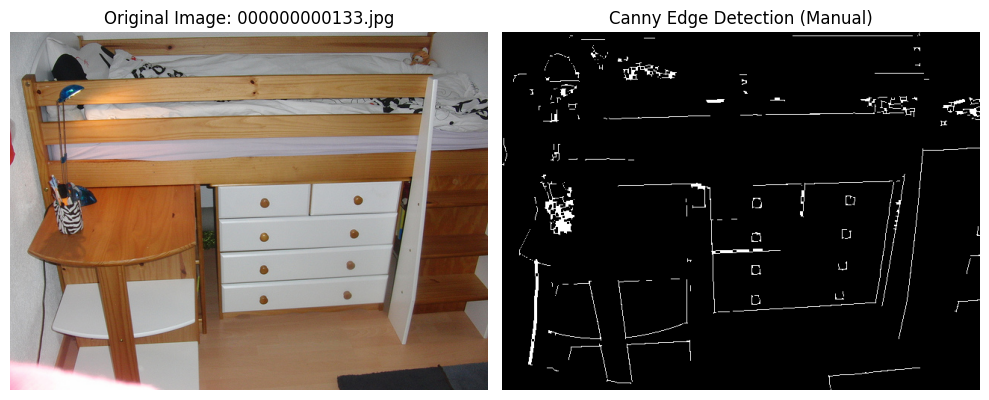

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Loop to process the first 25 images
for idx, file in enumerate(os.listdir(train_dir)[:25]):
    img_path = os.path.join(train_dir, file)
    img = cv2.imread(img_path)

    if img is None:
        print(f"Error: {file} could not be read.")
        continue

    print(f"Processing {file}...")

    # 1. Convert BGR to RGB for display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 2. Manual Canny Edge Detection
    edges = canny_edge_detection(img)

    # 3. Plot original and edge-detected images
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title(f"Original Image: {file}")
    plt.axis('off')

    # Canny Edges
    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    plt.title("Canny Edge Detection (Manual)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()
